# BOSTON AREA PROPERTIES: 
## Airbnb data insights

This document explores property data for short-term rental in Boston area, United States.

1. Import necessary packages:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


2. Load and explore data

In [2]:
calendar = pd.read_csv('calendar.csv')
listings = pd.read_csv('listings.csv')
reviews = pd.read_csv('reviews.csv')

In [3]:
calendar.head()

,listing_id,date,available,price
0,12147973,2017-09-05,f,NaN
1,12147973,2017-09-04,f,NaN
2,12147973,2017-09-03,f,NaN
3,12147973,2017-09-02,f,NaN
4,12147973,2017-09-01,f,NaN


In [4]:
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12147973,https://www.airbnb.com/rooms/12147973,20160906204935,2016-09-07,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",...,NaN,f,NaN,NaN,f,moderate,f,f,1,NaN
1,3075044,https://www.airbnb.com/rooms/3075044,20160906204935,2016-09-07,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...",...,9.0,f,NaN,NaN,t,moderate,f,f,1,1.30
2,6976,https://www.airbnb.com/rooms/6976,20160906204935,2016-09-07,Mexican Folk Art Haven in Boston,"Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...",none,The LOCATION: Roslindale is a safe and diverse...,...,10.0,f,NaN,NaN,f,moderate,t,f,1,0.47
3,1436513,https://www.airbnb.com/rooms/1436513,20160906204935,2016-09-07,Spacious Sunny Bedroom Suite in Historic Home,Come experience the comforts of home away from...,Most places you find in Boston are small howev...,Come experience the comforts of home away from...,none,Roslindale is a lovely little neighborhood loc...,...,10.0,f,NaN,NaN,f,moderate,f,f,1,1.00
4,7651065,https://www.airbnb.com/rooms/7651065,20160906204935,2016-09-07,Come Home to Boston,"My comfy, clean and relaxing home is one block...","Clean, attractive, private room, one block fro...","My comfy, clean and relaxing home is one block...",none,"I love the proximity to downtown, the neighbor...",...,10.0,f,NaN,NaN,f,flexible,f,f,1,2.25


In [5]:
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,1178162,4724140,2013-05-21,4298113,Olivier,My stay at islam's place was really cool! Good...
1,1178162,4869189,2013-05-29,6452964,Charlotte,Great location for both airport and city - gre...
2,1178162,5003196,2013-06-06,6449554,Sebastian,We really enjoyed our stay at Islams house. Fr...
3,1178162,5150351,2013-06-15,2215611,Marine,The room was nice and clean and so were the co...
4,1178162,5171140,2013-06-16,6848427,Andrew,Great location. Just 5 mins walk from the Airp...


1a. Lets explore the Calendar dataframe

In [6]:

calendar.isnull().mean()

listing_id    0.000000
date          0.000000
available     0.000000
price         0.508716
dtype: float64

1b. Lets explore Reviews dataframe

In [19]:
reviews.isnull().mean().sort_values()

listing_id       0.000000
id               0.000000
date             0.000000
reviewer_id      0.000000
reviewer_name    0.000000
comments         0.000776
dtype: float64

1c. Lets explore Listings dataframe

In [17]:
listings.isnull().mean()[listings.isnull().mean()>0].sort_values()

city                            0.000558
property_type                   0.000837
beds                            0.002510
bedrooms                        0.002789
host_location                   0.003068
market                          0.003905
bathrooms                       0.003905
zipcode                         0.010600
summary                         0.039888
host_neighbourhood              0.094561
host_response_time              0.131381
host_response_rate              0.131381
host_acceptance_rate            0.131381
neighbourhood                   0.151464
medium_url                      0.167085
xl_picture_url                  0.167085
thumbnail_url                   0.167085
last_review                     0.210879
first_review                    0.210879
reviews_per_month               0.210879
review_scores_rating            0.226778
review_scores_communication     0.228173
review_scores_cleanliness       0.228173
review_scores_checkin           0.228731
review_scores_va

### Q1: Can you describe the vibe of each Boston neighborhood using listing descriptions?

Missing values check:

In [20]:
listings['neighbourhood'].isnull().mean()

0.1514644351464435

In [23]:
listings['neighborhood_overview'].isnull().mean()

0.3947001394700139

In [25]:
pd.crosstab(listings['neighbourhood'].isnull(), listings['neighborhood_overview'].isnull(), margins=True)


neighborhood_overview,False,True,All
neighbourhood,,,
False,1839,1203,3042
True,331,212,543
All,2170,1415,3585


Gather and analyse relevant data:

In [28]:
# Neighbourhood sentiment can be derived from Neighbourhood and Neighbourhood_overview columns
properties=listings[['neighbourhood','neighborhood_overview']].dropna(axis=0)
properties.head()

,neighbourhood,neighborhood_overview
0,Roslindale,"Roslindale is quiet, convenient and friendly. ..."
1,Roslindale,"The room is in Roslindale, a diverse and prima..."
2,Roslindale,The LOCATION: Roslindale is a safe and diverse...
4,Roslindale,"I love the proximity to downtown, the neighbor..."
5,Roslindale,We love our corner of Roslindale! For quiet wa...


In [29]:
#check what neighbourhoods exist and whether there are any unexpected values
properties['neighbourhood'].unique()

array(['Roslindale', 'Jamaica Plain', 'Mission Hill', 'Fenway/Kenmore',
       'Back Bay', 'Leather District', 'Chinatown', 'Hyde Park',
       'North End', 'Roxbury', 'South End', 'East Boston', 'South Boston',
       'Charlestown', 'West End', 'Beacon Hill', 'Theater District',
       'Downtown Crossing', 'Government Center', 'Downtown',
       'Financial District', 'Allston-Brighton', 'West Roxbury',
       'Chestnut Hill', 'Dorchester', 'Mattapan', 'Brookline',
       'Cambridge', 'Somerville', 'Harvard Square'], dtype=object)

In [34]:
#improt necessary ML packages for sentiment analysis
import nltk
import string
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from wordcloud import WordCloud
import matplotlib.pyplot as plt


In [53]:
from textblob import TextBlob

In [37]:
#check how many instances of each neighbourhood in the set
properties['neighbourhood'].value_counts()

Jamaica Plain         224
Allston-Brighton      212
South End             204
Back Bay              172
Fenway/Kenmore        131
South Boston          129
Beacon Hill           117
Dorchester             87
North End              78
Roxbury                76
East Boston            67
Chinatown              56
Mission Hill           47
Charlestown            45
West End               42
Roslindale             39
Downtown Crossing      21
Theater District       20
West Roxbury           20
Mattapan               11
Hyde Park              10
Leather District        6
Downtown                4
Financial District      4
Brookline               4
Cambridge               4
Government Center       3
Chestnut Hill           2
Somerville              2
Harvard Square          2
Name: neighbourhood, dtype: int64

In [38]:
# Text Preprocessing Function
def clean_text(text):
    text = text.lower()  # Lowercasing
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    return text

In [39]:
properties['cleaned_text'] = properties['neighborhood_overview'].apply(clean_text)

In [41]:
# TF-IDF Vectorization
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(properties['cleaned_text'])

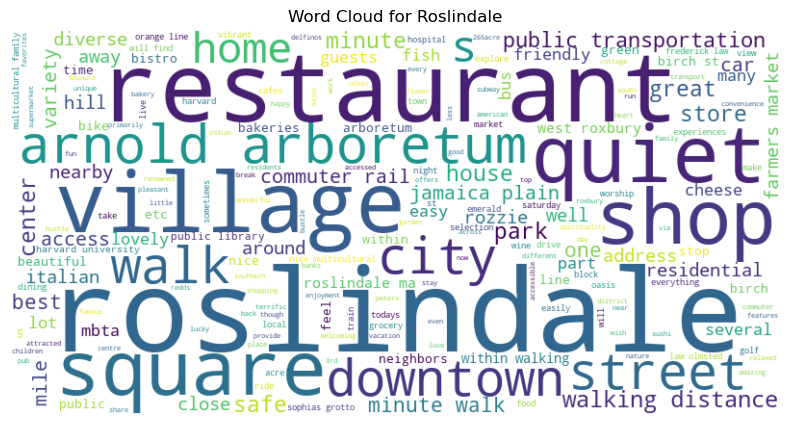

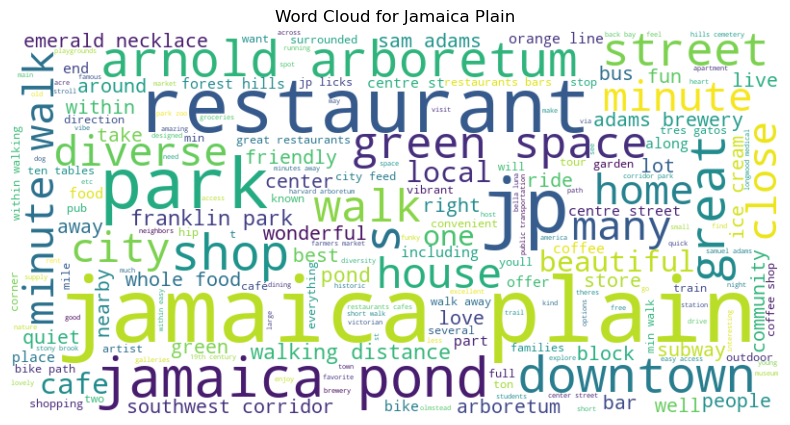

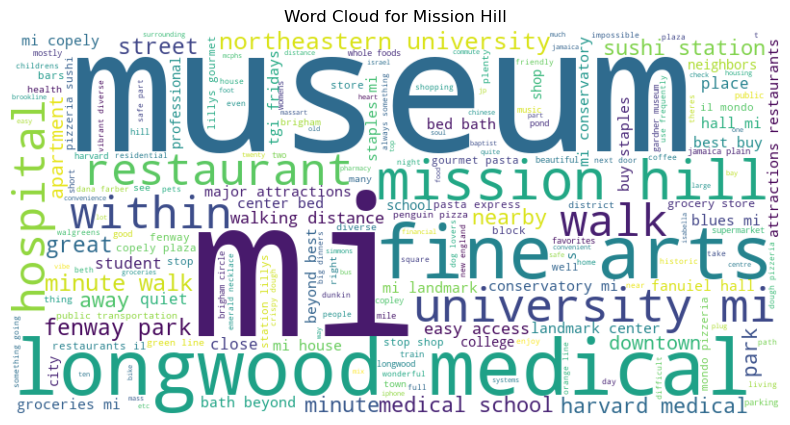

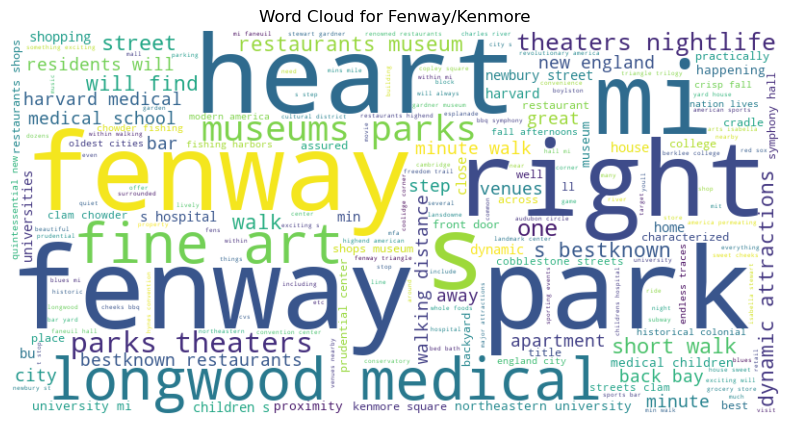

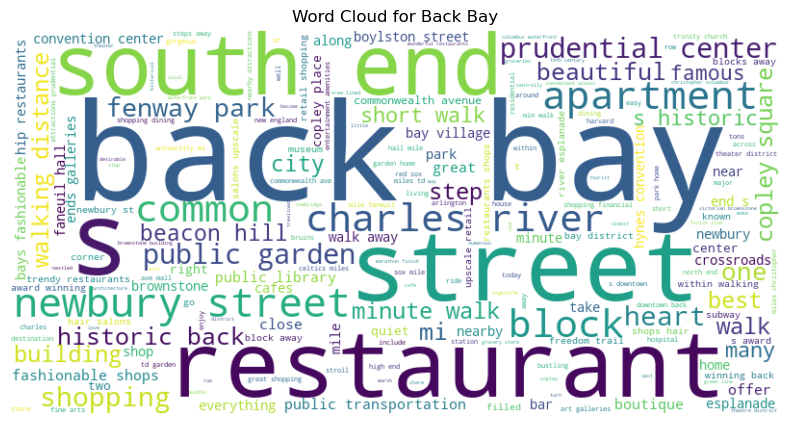

...

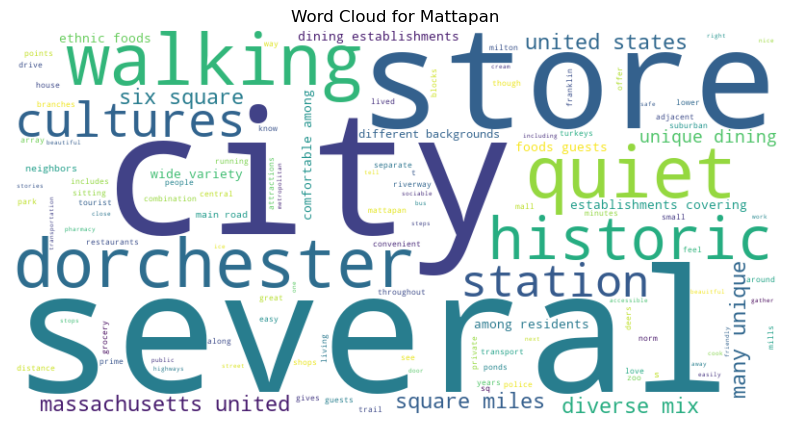

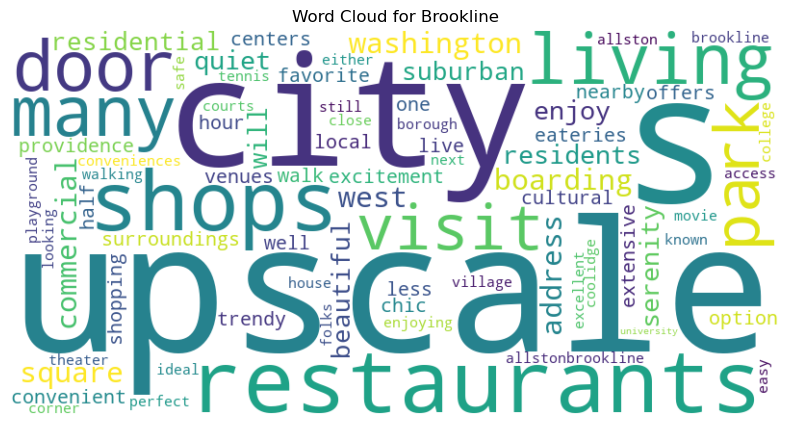

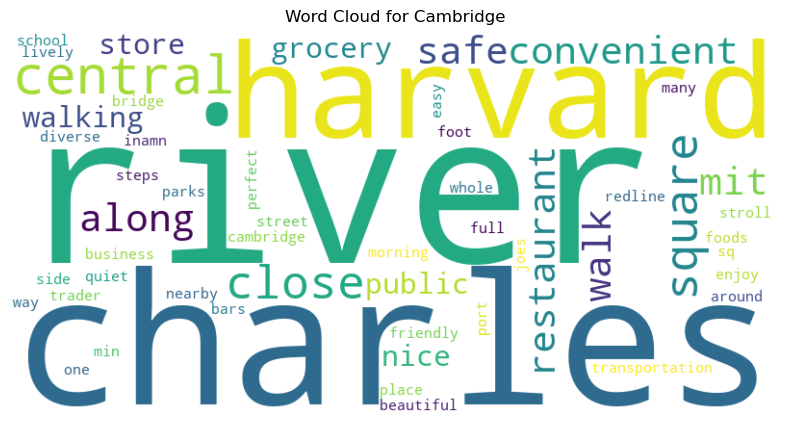

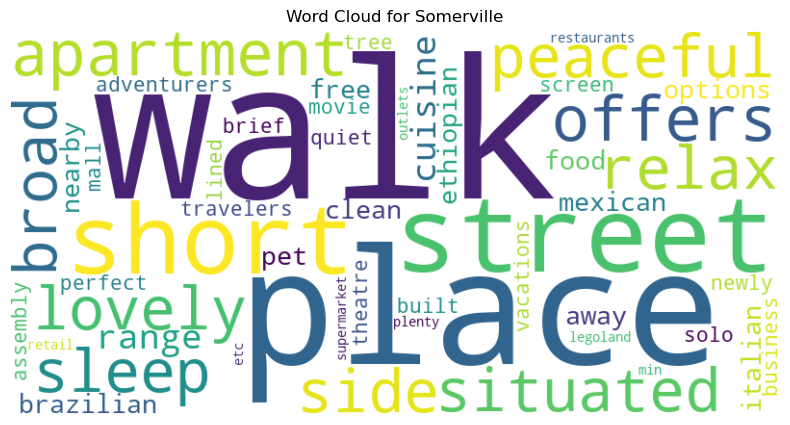

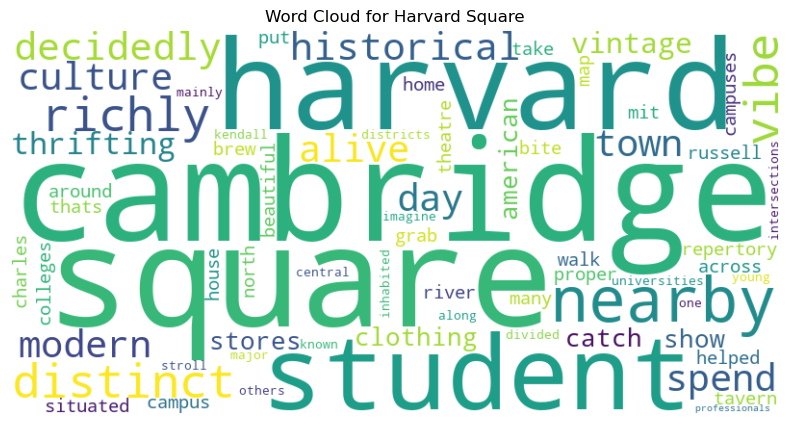

In [44]:
# Creating Word Clouds for Each Neighborhood
for neigh in properties['neighbourhood'].unique():
    text = ' '.join(properties[properties['neighbourhood'] == neigh]['cleaned_text'])
    # Remove specific words like Boston or location which are expected in each description but do not add any value
    text = text.replace("boston", "").replace("location", "").replace("area", "").replace("neighborhood", "").replace("located", "")
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for {neigh}")
    plt.show()

In [45]:
# Topic Modeling using LDA
lda = LatentDirichletAllocation(n_components=5, random_state=42)  
lda.fit(X)

LatentDirichletAllocation(n_components=5, random_state=42)

In [48]:
#Create a table with topics
feature_names = vectorizer.get_feature_names_out()
topics = {}
for topic_idx, topic in enumerate(lda.components_):
    topics[f"Topic {topic_idx+1}"] = [feature_names[i] for i in topic.argsort()[:-10 - 1:-1]]


In [54]:
# Sentiment Analysis
properties['sentiment'] = properties['cleaned_text'].apply(lambda x: TextBlob(x).sentiment.polarity)
neighborhood_sentiment = properties.groupby('neighbourhood')['sentiment'].mean().reset_index()
neighborhood_sentiment.columns = ['neighbourhood', 'average_sentiment']


In [63]:
neighborhood_sentiment.sort_values(by='average_sentiment', ascending=False)

,neighbourhood,average_sentiment
3,Brookline,0.327433
4,Cambridge,0.294659
29,West Roxbury,0.284766
11,East Boston,0.267773
0,Allston-Brighton,0.263549
26,South End,0.261391
22,Roslindale,0.255211
21,North End,0.252736
25,South Boston,0.246479
8,Dorchester,0.238784


In [64]:
# Display Neighborhood Vibes
print(pd.DataFrame(topics))

        Topic 1       Topic 2       Topic 3    Topic 4         Topic 5
0  neighborhood        boston        beacon    jamaica              mi
1         quiet          walk          hill      miles  transportation
2        boston   restaurants       charles      plain   neighborhoods
3   restaurants  neighborhood        boston       park    neighborhood
4       bostons        minute        street       pond          copley
5          area          away         river  arboretum          public
6       diverse         south           end     arnold          people
7      theaters       walking       streets         jp          boston
8       located        street  neighborhood      green     restaurants
9         close          bars        square     street       bordering


In [68]:
# Get topic distribution for each neighborhood description
topic_distributions = lda.transform(X)

# Convert to DataFrame for analysis
topic_df = pd.DataFrame(topic_distributions, columns=[f'Topic {i+1}' for i in range(lda.n_components)])
# Define topic names by generalizing words in each column
topic_names = {
    "Topic 1": "Community & Atmosphere",
    "Topic 2": "Walkability & Lifestyle",
    "Topic 3": "Landmarks & Urban Features",
    "Topic 4": "Nature & Green Spaces",
    "Topic 5": "Transportation & Accessibility"
}

# Rename topic columns in the DataFrame
topic_df = topic_df.rename(columns=topic_names)

# Add the neighborhood names
topic_df['neighbourhood'] = properties['neighbourhood'].values

# Compute average topic proportions per neighborhood
neighborhood_topics = topic_df.groupby('neighbourhood').mean().reset_index()

# Display the first few rows
neighborhood_topics.head()


,neighbourhood,Community & Atmosphere,Walkability & Lifestyle,Landmarks & Urban Features,Nature & Green Spaces,Transportation & Accessibility
0,Allston-Brighton,0.122871,0.548936,0.211370,0.063542,0.053281
1,Back Bay,0.214387,0.412915,0.167218,0.090501,0.114978
2,Beacon Hill,0.091400,0.237911,0.382983,0.088995,0.198711
3,Brookline,0.298891,0.535049,0.076890,0.044990,0.044181
4,Cambridge,0.046334,0.255979,0.605416,0.045509,0.046762


In [69]:
# Find the dominant topic for each neighborhood
neighborhood_topics['dominant_topic'] = neighborhood_topics.iloc[:, 1:].idxmax(axis=1)

# Display the results
neighborhood_topics[['neighbourhood', 'dominant_topic']].head()


,neighbourhood,dominant_topic
0,Allston-Brighton,Walkability & Lifestyle
1,Back Bay,Walkability & Lifestyle
2,Beacon Hill,Landmarks & Urban Features
3,Brookline,Walkability & Lifestyle
4,Cambridge,Landmarks & Urban Features


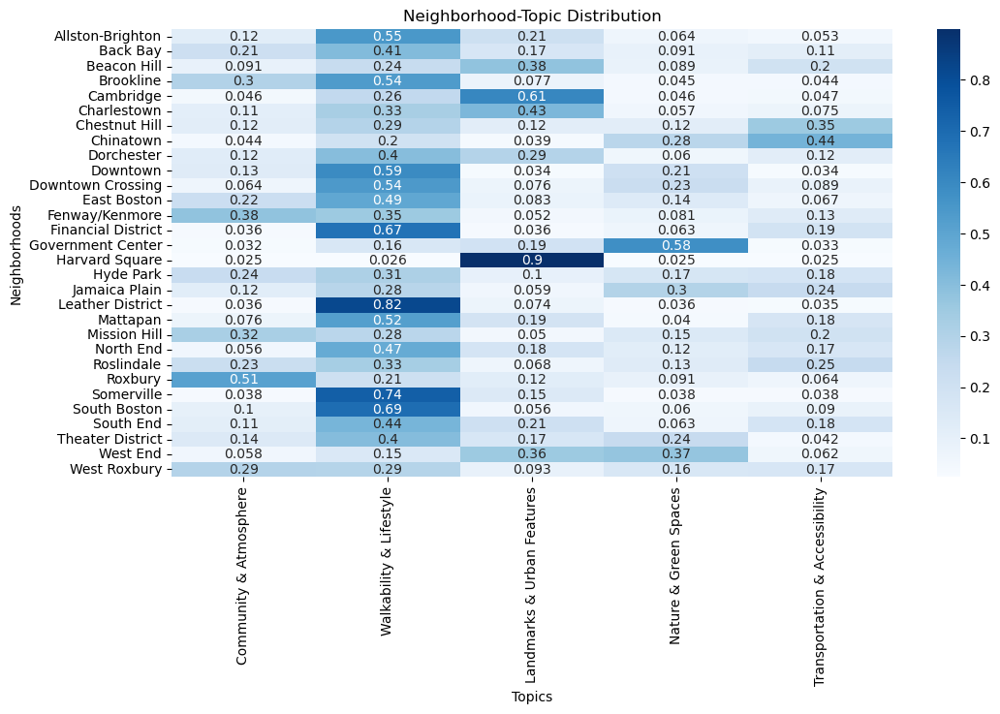

In [71]:
#plot each neighbourhood and topic on the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(neighborhood_topics.drop(columns=['dominant_topic']).set_index('neighbourhood'), cmap='Blues', annot=True)
plt.title("Neighborhood-Topic Distribution")
plt.xlabel("Topics")
plt.ylabel("Neighborhoods")
plt.show()

In [78]:
# Since the previous heatmap is too crowded, get the top 10 neighborhoods based on listing count
top_neighborhoods = properties['neighbourhood'].value_counts().index[:10]
# Filter the dataset to include only the top 10 neighborhoods
filtered_neighborhood_topics = neighborhood_topics[neighborhood_topics['neighbourhood'].isin(top_neighborhoods)]
filtered_neighborhood_topics.head()

,neighbourhood,Community & Atmosphere,Walkability & Lifestyle,Landmarks & Urban Features,Nature & Green Spaces,Transportation & Accessibility,dominant_topic
0,Allston-Brighton,0.122871,0.548936,0.211370,0.063542,0.053281,Walkability & Lifestyle
1,Back Bay,0.214387,0.412915,0.167218,0.090501,0.114978,Walkability & Lifestyle
2,Beacon Hill,0.091400,0.237911,0.382983,0.088995,0.198711,Landmarks & Urban Features
8,Dorchester,0.124929,0.402006,0.293814,0.059736,0.119514,Walkability & Lifestyle
12,Fenway/Kenmore,0.380824,0.353271,0.051743,0.080918,0.133245,Community & Atmosphere


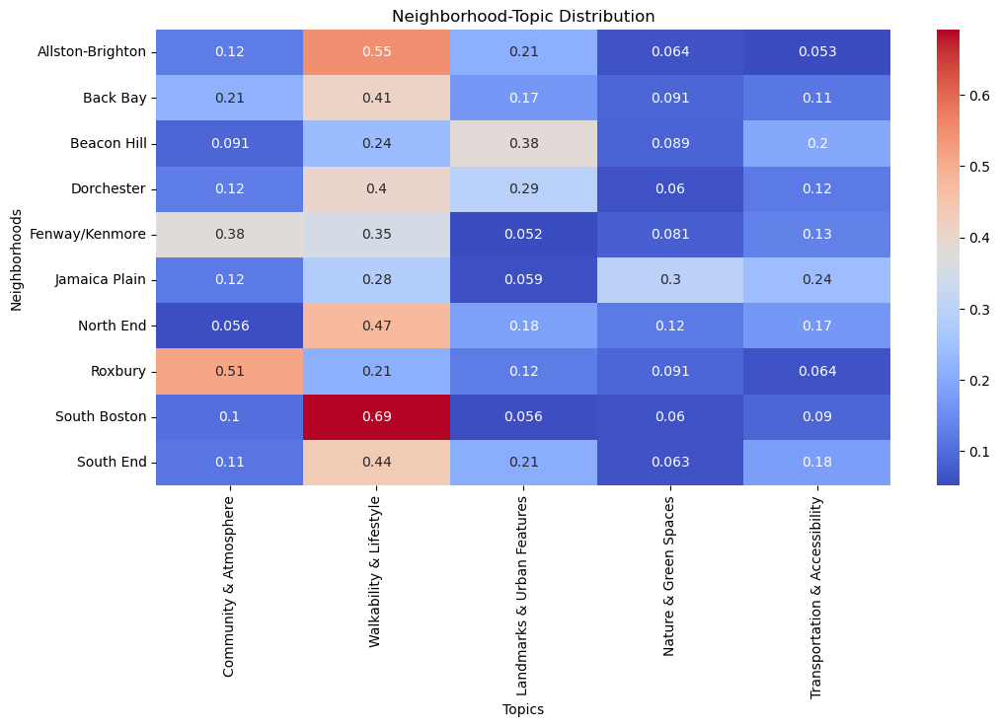

In [79]:
plt.figure(figsize=(12, 6))
sns.heatmap(filtered_neighborhood_topics.drop(columns=['dominant_topic']).set_index('neighbourhood'), cmap='coolwarm', annot=True)
plt.title("Neighborhood-Topic Distribution")
plt.xlabel("Topics")
plt.ylabel("Neighborhoods")
plt.show()

The above chart describes the sentiment of top neighbourhoods and can be used by guests to select area to stay in

### What are the busiest times of the year to visit Boston? By how much do prices spike?

In [84]:
# to answer this question, we shall primarily rely on the calendar df
calendar

,listing_id,date,available,price
0,12147973,2017-09-05,f,NaN
1,12147973,2017-09-04,f,NaN
2,12147973,2017-09-03,f,NaN
3,12147973,2017-09-02,f,NaN
4,12147973,2017-09-01,f,NaN
...,...,...,...,...
1308885,14504422,2016-09-10,f,NaN
1308886,14504422,2016-09-09,f,NaN
1308887,14504422,2016-09-08,f,NaN
1308888,14504422,2016-09-07,f,NaN


In [88]:
#check for missing values
calendar.isnull().mean()

listing_id    0.000000
date          0.000000
available     0.000000
price         0.508716
dtype: float64

In [90]:
#since all the missing values are in the response variable, lets check if they are all in the unavailable properties
calendar[calendar['available']=='t'].isnull().mean()

listing_id    0.0
date          0.0
available     0.0
price         0.0
dtype: float64

In [92]:
'Dates range from {} to {} '.format(calendar['date'].min(),calendar['date'].max())

'Dates range from 2016-09-06 to 2017-09-05 '

In [118]:
# Convert date column to datetime
calendar['date'] = pd.to_datetime(calendar['date'])

# Extract month and year
calendar['year_month'] = calendar['date'].dt.to_period('M')

# Step 1: Determine least busiest months by counting available listings
avail_months = calendar[calendar['available'] == 't'].groupby('year_month').size()
avail_months_df = pd.DataFrame(avail_months).reset_index()
avail_months_df.columns = ['month', 'avail']
avail_months_df


,month,avail
0,2016-09,24401
1,2016-10,46345
2,2016-11,58888
3,2016-12,60997
4,2017-01,63181
5,2017-02,56810
6,2017-03,55181
7,2017-04,51382
8,2017-05,53600
9,2017-06,52731


In [119]:
# In order to get a full-year view, add last row's avail value to the first row's avail value to account for 5 days missed in Sept 2016
avail_months_df.iloc[0, 1] += avail_months_df.iloc[-1, 1]

# Drop the last row
avail_months_df = avail_months_df.iloc[:-1]

avail_months_df


,month,avail
0,2016-09,33398
1,2016-10,46345
2,2016-11,58888
3,2016-12,60997
4,2017-01,63181
5,2017-02,56810
6,2017-03,55181
7,2017-04,51382
8,2017-05,53600
9,2017-06,52731


In [120]:
# Replace months numbers with names
avail_months_df['month']=avail_months_df['month'].astype(str)
avail_months_df['month']=pd.to_datetime(avail_months_df['month']).dt.strftime('%B')
avail_months_df

/var/folders/kh/f17tgptd5qn4zbv693ym6bcr0000gn/T/ipykernel_17649/1832950334.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  avail_months_df['month']=avail_months_df['month'].astype(str)
/var/folders/kh/f17tgptd5qn4zbv693ym6bcr0000gn/T/ipykernel_17649/1832950334.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  avail_months_df['month']=pd.to_datetime(avail_months_df['month']).dt.strftime('%B')


,month,avail
0,September,33398
1,October,46345
2,November,58888
3,December,60997
4,January,63181
5,February,56810
6,March,55181
7,April,51382
8,May,53600
9,June,52731


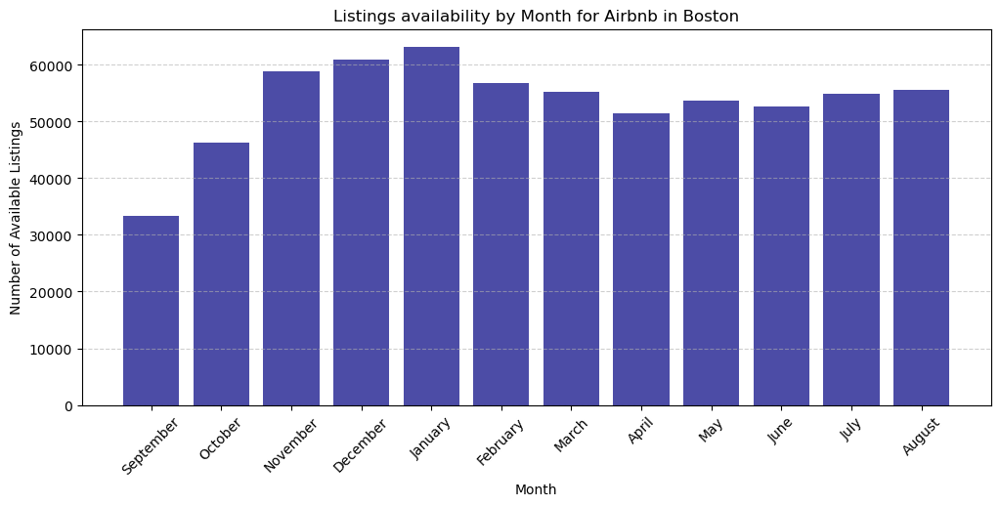

In [121]:
# Visualize availability of listings per months
plt.figure(figsize=(12, 5))
plt.bar(avail_months_df['month'], avail_months_df['avail'], color='navy', alpha=0.7)
plt.title('Listings availability by Month for Airbnb in Boston')
plt.xlabel('Month')
plt.ylabel('Number of Available Listings')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()

The busiest months to visit Boston are Spet and October

Next step is to understand how much the prices spike

We shall now work with the price column

In [128]:
# Remove the dollar sign and convert to float
calendar['price'] = calendar['price'].replace('[\$,]', '', regex=True).astype(float)

In [133]:
#Create a dataframe for average price in each month
avg_price_per_month = calendar[calendar['available'] == 't'].groupby('year_month')['price'].mean()
avg_price_per_month = pd.DataFrame(avg_price_per_month).reset_index()
avg_price_per_month.columns = ['month', 'av_price']
# Drop the last row for 5 days in Sept 2017
avg_price_per_month=avg_price_per_month.iloc[:-1]
avg_price_per_month['month']=avg_price_per_month['month'].astype(str)
avg_price_per_month['month']=pd.to_datetime(avg_price_per_month['month']).dt.strftime('%B')
avg_price_per_month['av_price']=avg_price_per_month['av_price'].round().astype('int')
avg_price_per_month

,month,av_price
0,September,253
1,October,233
2,November,203
3,December,193
4,January,183
5,February,181
6,March,182
7,April,197
8,May,194
9,June,197


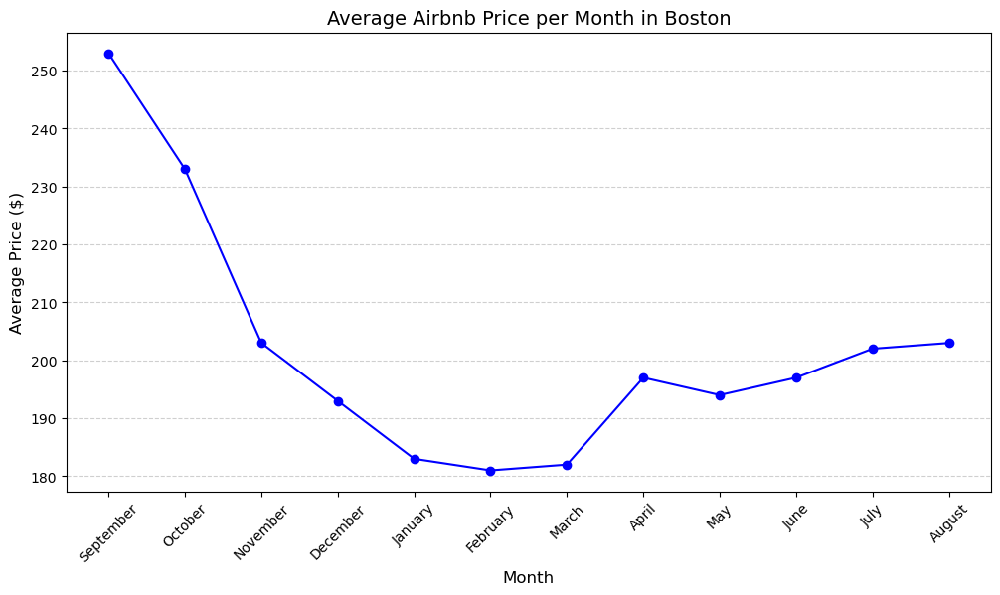

In [146]:
#Vizualize how the prices change month on month
plt.figure(figsize=(12, 6))
plt.plot(avg_price_per_month['month'], avg_price_per_month['av_price'], marker='o', linestyle='-', color='blue')

# Formatting the plot
plt.title('Average Airbnb Price per Month in Boston', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average Price ($)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.6)

Insights from the above chart confirm our findings of listings availability: Sept and Oct are the busiest months in the city and offer tourists 2x more expensive accommodation.

Apart from paying extremly high rental fees, tourists are often expected to cover cleaning fees. Since many customers complain about these cleaning fees, it is useful to understand whether there is any logic in how high they can get.

### Cleaning fee investigation

From the listings datafram, we select a list of columns that could be relevant / interesting to use in explaining the variation in cleaning fees (the choice has been made arbitrarily based on common sense). The set of features used is presented in the dataframe below

In [151]:
df=listings[['last_scraped','cleaning_fee','host_is_superhost','neighbourhood_cleansed','bedrooms','number_of_reviews','review_scores_cleanliness']]
df

,last_scraped,cleaning_fee,host_is_superhost,neighbourhood_cleansed,bedrooms,number_of_reviews,review_scores_cleanliness
0,2016-09-07,$35.00,f,Roslindale,2.0,0,NaN
1,2016-09-07,$10.00,f,Roslindale,1.0,36,9.0
2,2016-09-07,NaN,t,Roslindale,1.0,41,9.0
3,2016-09-07,$50.00,f,Roslindale,1.0,1,10.0
4,2016-09-07,$15.00,t,Roslindale,1.0,29,10.0
...,...,...,...,...,...,...,...
3580,2016-09-07,NaN,f,Charlestown,1.0,4,10.0
3581,2016-09-07,$15.00,f,Allston,1.0,0,NaN
3582,2016-09-07,NaN,f,Charlestown,1.0,0,NaN
3583,2016-09-07,NaN,f,Charlestown,1.0,2,8.0


In [152]:
# remove rows with an empty explanatory variable
df=df.dropna(axis=0, subset=['cleaning_fee'])

In [153]:
# check to ensure the dataset remain sufficiently large after removal of empty rows
df.shape

(2478, 7)

In [155]:
#check for NaN values
df.isnull().mean()

last_scraped                 0.000000
cleaning_fee                 0.000000
host_is_superhost            0.000000
neighbourhood_cleansed       0.000000
bedrooms                     0.000807
number_of_reviews            0.000000
review_scores_cleanliness    0.202986
dtype: float64

In [156]:
# remove rows with no bedrooms info since there are few of them and cannot be replaced with a mean
df=df.dropna(axis=0, subset=['bedrooms'])
# Fill NaN values in review_scores_cleanliness with the average for the neighbourhood
df['review_scores_cleanliness'] = df['review_scores_cleanliness'].fillna(
    df.groupby('neighbourhood_cleansed')['review_scores_cleanliness'].transform('mean'))
df

,last_scraped,cleaning_fee,host_is_superhost,neighbourhood_cleansed,bedrooms,number_of_reviews,review_scores_cleanliness
0,2016-09-07,$35.00,f,Roslindale,2.0,0,9.718750
1,2016-09-07,$10.00,f,Roslindale,1.0,36,9.000000
3,2016-09-07,$50.00,f,Roslindale,1.0,1,10.000000
4,2016-09-07,$15.00,t,Roslindale,1.0,29,10.000000
5,2016-09-07,$30.00,t,Roslindale,1.0,8,10.000000
...,...,...,...,...,...,...,...
3573,2016-09-07,$25.00,f,Charlestown,1.0,2,10.000000
3576,2016-09-07,$85.00,f,Allston,1.0,0,9.179487
3579,2016-09-07,$10.00,f,Allston,1.0,0,9.179487
3581,2016-09-07,$15.00,f,Allston,1.0,0,9.179487


In [157]:
# Replace dollar signs in cleaning_fee column
df['cleaning_fee'] = df['cleaning_fee'].replace('[\$,]', '', regex=True).astype(float)
df.isnull().mean()

last_scraped                 0.0
cleaning_fee                 0.0
host_is_superhost            0.0
neighbourhood_cleansed       0.0
bedrooms                     0.0
number_of_reviews            0.0
review_scores_cleanliness    0.0
dtype: float64

In [158]:
# Convert last_scrapped column to datetime
df['last_scraped'] = pd.to_datetime(df['last_scraped'])

# Extract month and year
df['year_month'] = df['last_scraped'].dt.to_period('M')
df

,last_scraped,cleaning_fee,host_is_superhost,neighbourhood_cleansed,bedrooms,number_of_reviews,review_scores_cleanliness,year_month
0,2016-09-07,35.0,f,Roslindale,2.0,0,9.718750,2016-09
1,2016-09-07,10.0,f,Roslindale,1.0,36,9.000000,2016-09
3,2016-09-07,50.0,f,Roslindale,1.0,1,10.000000,2016-09
4,2016-09-07,15.0,t,Roslindale,1.0,29,10.000000,2016-09
5,2016-09-07,30.0,t,Roslindale,1.0,8,10.000000,2016-09
...,...,...,...,...,...,...,...,...
3573,2016-09-07,25.0,f,Charlestown,1.0,2,10.000000,2016-09
3576,2016-09-07,85.0,f,Allston,1.0,0,9.179487,2016-09
3579,2016-09-07,10.0,f,Allston,1.0,0,9.179487,2016-09
3581,2016-09-07,15.0,f,Allston,1.0,0,9.179487,2016-09


In [168]:
# Number of bedrooms cannot equal zero: if it is a studio, it is still qualified as one bedroom
df.loc[df['bedrooms'] == 0, 'bedrooms'] = 1


### Does cleaning fee differ from area to area?

To answer this question, we shall create a table of average cleaning fee per bedroom for every neighbourhood

In [170]:
df['fee_per_bedroom']=df['cleaning_fee']/df['bedrooms'] # to ensure flat size is accounted for in the comparison
avg_clean_fee = df.groupby('neighbourhood_cleansed')['fee_per_bedroom'].mean()
avg_clean_fee = pd.DataFrame(avg_clean_fee).reset_index()
avg_clean_fee.columns = ['neighbourhood', 'av_fee_per_bedroom']
avg_clean_fee['av_fee_per_bedroom']=avg_clean_fee['av_fee_per_bedroom'].round()
avg_clean_fee

,neighbourhood,av_fee_per_bedroom
0,Allston,37.0
1,Back Bay,71.0
2,Bay Village,83.0
3,Beacon Hill,70.0
4,Brighton,41.0
5,Charlestown,45.0
6,Chinatown,62.0
7,Dorchester,33.0
8,Downtown,73.0
9,East Boston,32.0


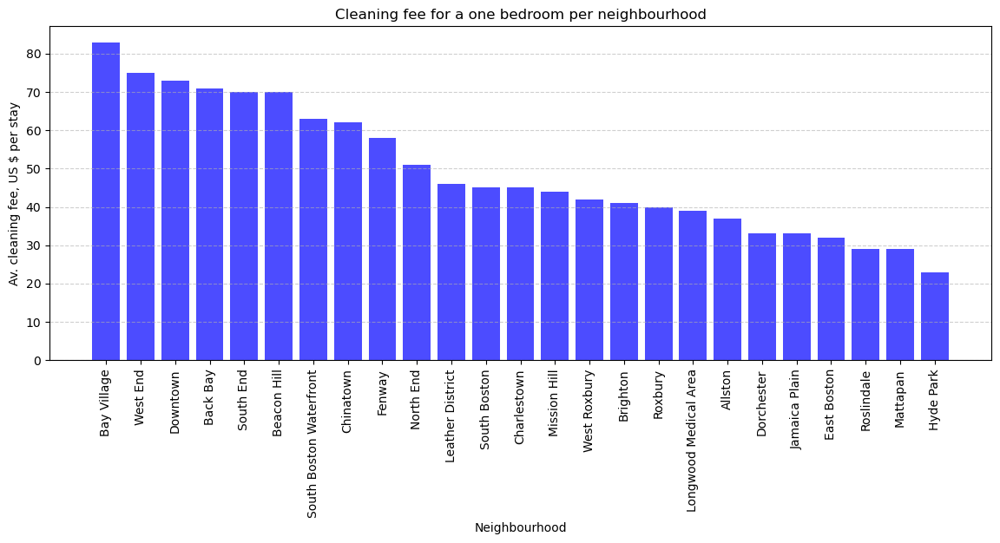

In [175]:
# srot values before plotting them
avg_clean_fee = avg_clean_fee.sort_values(by='av_fee_per_bedroom', ascending=False)
# plot the table
plt.figure(figsize=(14, 5))
plt.bar(avg_clean_fee['neighbourhood'], avg_clean_fee['av_fee_per_bedroom'], color='blue', alpha=0.7)
plt.title('Cleaning fee for a one bedroom per neighbourhood')
plt.xlabel('Neighbourhood')
plt.ylabel('Av. cleaning fee, US $ per stay')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()

In [176]:
# check most popular neighbourhoods to see if they have the highest cleaning fees as well
top_neighborhoods

Index(['Jamaica Plain', 'Allston-Brighton', 'South End', 'Back Bay',
       'Fenway/Kenmore', 'South Boston', 'Beacon Hill', 'Dorchester',
       'North End', 'Roxbury'],
      dtype='object')

### Is the higher cleaning fee a guarantee of cleanliness?

In [177]:
df

,last_scraped,cleaning_fee,host_is_superhost,neighbourhood_cleansed,bedrooms,number_of_reviews,review_scores_cleanliness,year_month,fee_per_bedroom
0,2016-09-07,35.0,f,Roslindale,2.0,0,9.718750,2016-09,17.5
1,2016-09-07,10.0,f,Roslindale,1.0,36,9.000000,2016-09,10.0
3,2016-09-07,50.0,f,Roslindale,1.0,1,10.000000,2016-09,50.0
4,2016-09-07,15.0,t,Roslindale,1.0,29,10.000000,2016-09,15.0
5,2016-09-07,30.0,t,Roslindale,1.0,8,10.000000,2016-09,30.0
...,...,...,...,...,...,...,...,...,...
3573,2016-09-07,25.0,f,Charlestown,1.0,2,10.000000,2016-09,25.0
3576,2016-09-07,85.0,f,Allston,1.0,0,9.179487,2016-09,85.0
3579,2016-09-07,10.0,f,Allston,1.0,0,9.179487,2016-09,10.0
3581,2016-09-07,15.0,f,Allston,1.0,0,9.179487,2016-09,15.0


In [178]:
# break cleaning fees into quartiles and calculate mean cleaning fee per bedroom
df.groupby(pd.qcut(df['fee_per_bedroom'], q=4))['review_scores_cleanliness'].mean()


fee_per_bedroom
(3.749, 25.0]    9.168852
(25.0, 45.0]     9.372223
(45.0, 60.0]     9.326088
(60.0, 300.0]    9.355398
Name: review_scores_cleanliness, dtype: float64

In [179]:
# Compute correlation
df[['fee_per_bedroom', 'review_scores_cleanliness']].corr()


,fee_per_bedroom,review_scores_cleanliness
fee_per_bedroom,1.000000,0.043266
review_scores_cleanliness,0.043266,1.000000


Based on the above, the higher cleaning fee is not associated with increase in property cleanliness